In [1]:
%load_ext autoreload
%autoreload complete

In [2]:
from pathlib import Path
import pickle

import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cfr import ProxyDatabase
import cfr
from tqdm import tqdm
import xesmf as xe
import nc_time_axis

from lmrecon.grid import GLOBAL_GRID
from lmrecon.plotting import plot_field, subplots_cartopy, use_zero_xlim
from lmrecon.util import get_base_path, get_closest_gridpoint, get_closest_gridpoint_with_data, get_data_path, is_coordinate_inside_box
from lmrecon.io import open_mfdataset
from lmrecon.stats import area_weighted_mean, average_annually, average_seasonally, annualize_seasonal_data, rmse, area_weighted_rmse
from lmrecon.psm import LinearPSM, ReducedSpacePSM
from lmrecon.time import map_season_to_decimal, map_decimal_to_season, Season, convert_decimal_year_to_datetime, convert_datetime_to_decimal_year, use_tuple_time_coords, use_decimal_year_time_coords
from lmrecon.mapper import PhysicalSpaceForecastSpaceMapper
from lmrecon.datasets import load_gistemp, load_ersst, load_dcenti, load_dcent

Standardizing each of the ProxyRecords: 100%|██████████| 549/549 [00:01<00:00, 298.65it/s] 


(<Figure size 3000x3000 with 1 Axes>, {'map': <GeoAxes: >})

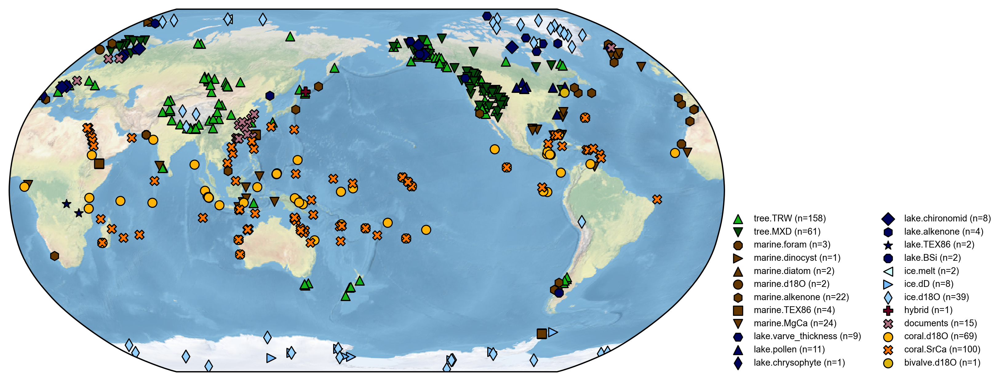

In [155]:
pdb = pickle.load((get_base_path() / "datasets/proxies/combined_temperature.pkl").open("rb"))
pdb = pdb.slice((1, np.inf))
pdb = pdb.standardize(ref_period=None)
assert np.all([p.time_unit == "yr" for p in pdb.records.values()])
pdb.plot()

In [129]:
n_seasonal_to_annual = len((pdb.filter(by="dt", keys=(0.26, 0.49)) + pdb.filter(by="dt", keys=(0.51, 0.99))).records)
if n_seasonal_to_annual > 0:
    print(f"Discarding {n_seasonal_to_annual} proxies since they have a resolution between seasonal and annual")

Discarding 1 proxies since they have a resolution between seasonal and annual


In [130]:
def seasonalize_subseasonal_proxies(pdb):
    """Average all proxies with temporal resolution below seasonal to seasonal resolution"""
    seasonalized_proxies = {}
    for key, proxy in tqdm(pdb.records.items()):
        # Some timestamps are for beginning, but more for center of interval
        # -> don't shift time axis to center interval
        # Would require detection of which convention is used
        da = xr.DataArray(proxy.value, coords=dict(time=proxy.time))
        da_seasonal = average_seasonally(da, weight_months=False)

        proxy = proxy.copy()
        proxy.time = da_seasonal.time.data
        proxy.value = da_seasonal.data
        proxy.dt = 1 / 4

        seasonalized_proxies[key] = proxy

    return ProxyDatabase(seasonalized_proxies)

In [131]:
pdb_subseasonal = pdb.filter(by="dt", keys=(0, 0.24))
pdb_seasonal = seasonalize_subseasonal_proxies(pdb_subseasonal) + pdb.filter(by="dt", keys=(0.24, 0.26))
# pdb_seasonal = shift_seasonal_proxies(pdb.filter(by="dt", keys=(0.24, 0.26)))
# pdb_seasonal = seasonalize_subseasonal_proxies(pdb_ice) 

100%|██████████| 133/133 [00:00<00:00, 347.31it/s]


(<Figure size 3000x3000 with 1 Axes>, {'map': <GeoAxes: >})

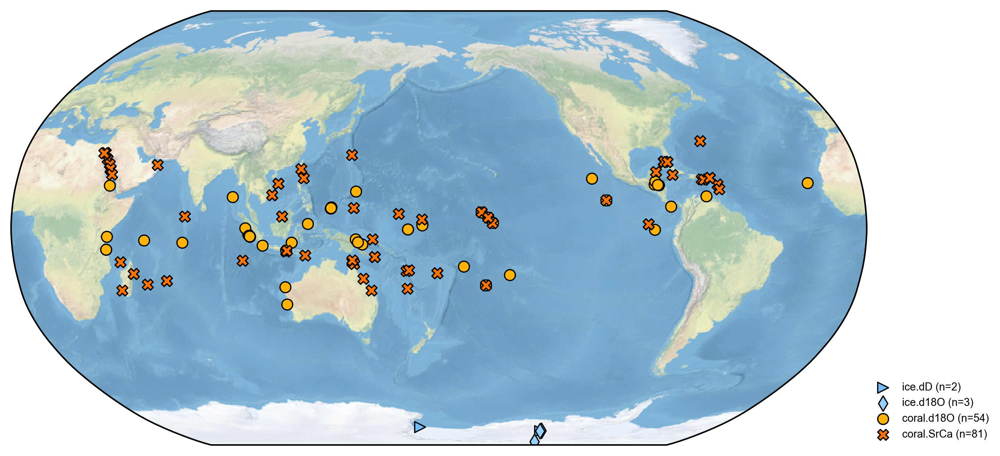

In [132]:
pdb_seasonal.plot()

(<Figure size 3000x3000 with 1 Axes>, {'map': <GeoAxes: >})

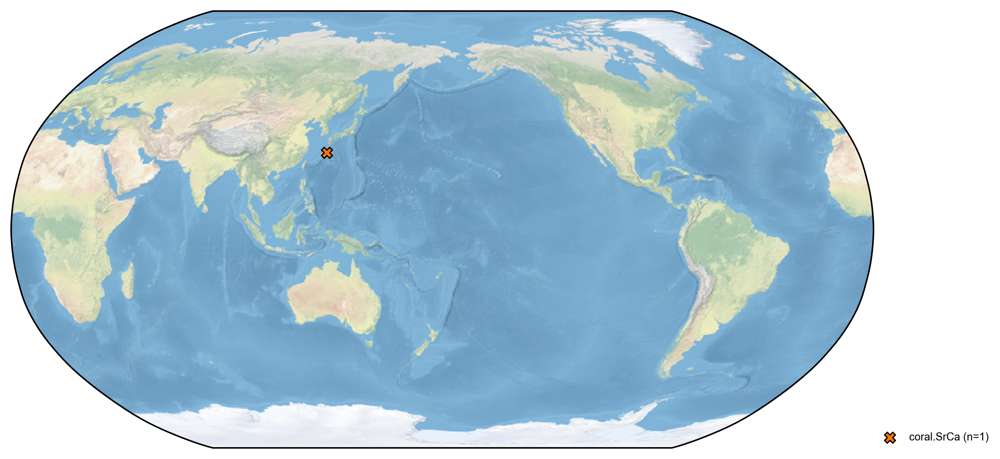

In [133]:
pdb_biannual = pdb.filter(by="dt", keys=(0.49, 0.51))
pdb_biannual.plot()

In [134]:
def ensure_annual_resolution(pdb):
    """
    Ensure that all nominally annual-resolution proxies only have one data point per year.
    Some annual proxies have two values in some years, or have non-integer timestamps.
    """
    annual_proxies = {}
    for key, proxy in tqdm(pdb.records.items()):
        da = xr.DataArray(proxy.value, coords=dict(time=proxy.time))
        da_annual = da.groupby(da.time.astype(int)).mean()

        proxy = proxy.copy()
        proxy.time = da_annual.time.data
        proxy.value = da_annual.data
        proxy.dt = 1

        annual_proxies[key] = proxy

    return ProxyDatabase(annual_proxies)

def annualize_biannual_proxies(pdb):
    """Average all proxies with temporal resolution of biannual to annual resolution"""
    annual_proxies = {}
    for key, proxy in tqdm(pdb.records.items()):
        da = xr.DataArray(proxy.value, coords=dict(time=proxy.time))

        # Ensure only full years are included, otherwise the annual average has a strong seasonal signal
        groupby = da.groupby(da.time.astype(int))
        groups = list(groupby.groups.values())
        da_annual = groupby.mean()
        if len(groups[0]) < 2:
            da_annual = da_annual.isel(time=slice(1, None))
        if len(groups[-1]) < 2:
            da_annual = da_annual.isel(time=slice(None, -1))

        proxy = proxy.copy()
        proxy.time = da_annual.time.data
        proxy.value = da_annual.data
        proxy.dt = 1

        annual_proxies[key] = proxy

    return ProxyDatabase(annual_proxies)

annualize_biannual_proxies(pdb_biannual)

100%|██████████| 1/1 [00:00<00:00, 407.33it/s]


100%|██████████| 1/1 [00:00<00:00, 683.00it/s]


(<Figure size 3000x3000 with 1 Axes>, {'map': <GeoAxes: >})

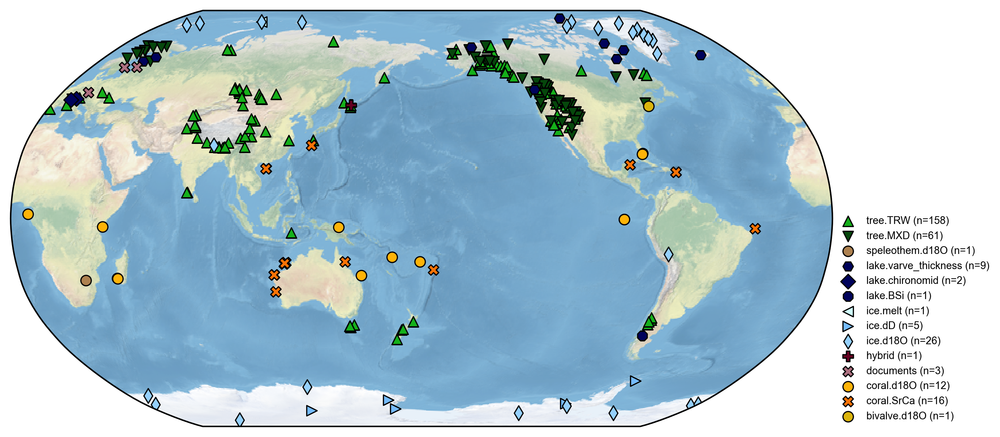

In [135]:
pdb_annual = ensure_annual_resolution(pdb.filter(by="dt", keys=(0.99, 1.01))) + annualize_biannual_proxies(pdb_biannual)
pdb_annual.plot()

Discarding 115 proxies since they have multiannual resulution


(<Figure size 3000x3000 with 1 Axes>, {'map': <GeoAxes: >})

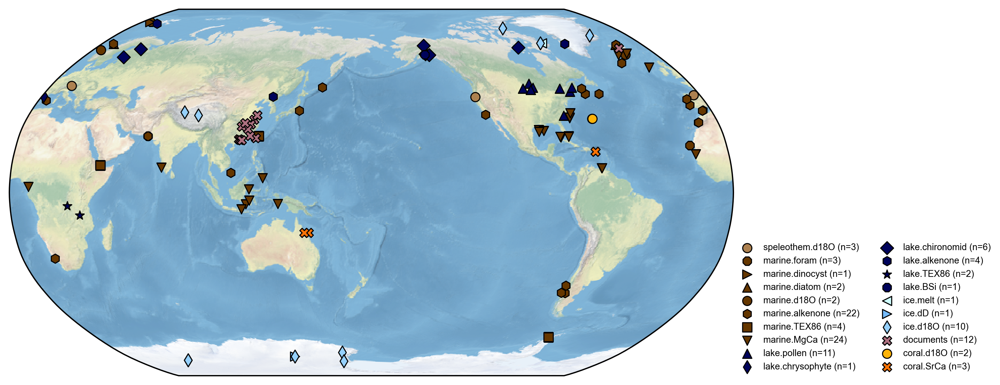

In [136]:
pdb_multiannual = pdb.filter(by="dt", keys=(1.01, np.inf))
print(f"Discarding {len(pdb_multiannual.records)} proxies since they have multiannual resulution")
pdb_multiannual.plot()

In [137]:
mapper_id = "2026-02-18T10-50-28"
mapper = PhysicalSpaceForecastSpaceMapper.load(get_base_path() / f"lmrecon/mapper/{mapper_id}/mapper.pkl")

In [ ]:
da_tas = load_gistemp()["tas"]#.sel(time=slice(1900, None))
# da_tas = load_dcenti()["ts_merged"]

In [139]:
da_tas_trunc = use_tuple_time_coords(mapper.truncate_dataset(da_tas.to_dataset(name="tas"))["tas"].compute())
da_tas_trunc

<xarray.DataArray 'tas' (time: 703, lat: 90, lon: 180)> Size: 91MB
array([[[-1.40427294, -1.4002547 , -1.39644185, ..., -1.41354343,
         -1.41083304, -1.40762331],
        [-1.71969266, -1.73047606, -1.73929284, ..., -1.69153949,
         -1.70131654, -1.7124172 ],
        [-1.87220119, -1.8834563 , -1.89750209, ..., -1.82108815,
         -1.84035275, -1.85641656],
        ...,
        [-0.55974181, -0.55718827, -0.55495704, ..., -0.56800115,
         -0.56463491, -0.562201  ],
        [-0.59421745, -0.59276451, -0.58919409, ..., -0.60382492,
         -0.60030905, -0.59658728],
        [-0.61531268, -0.61472676, -0.61463624, ..., -0.61595714,
         -0.61519532, -0.61506569]],

       [[-0.44447181, -0.44283575, -0.44138397, ..., -0.44724218,
         -0.44676588, -0.44480115],
        [-0.48526442, -0.48725273, -0.49116287, ..., -0.47099704,
         -0.47511166, -0.48003913],
        [-0.47673506, -0.48372655, -0.49056083, ..., -0.45932853,
         -0.46466415, -0.46951353],
...
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]]], shape=(703, 90, 180))
Coordinates:
  * time     (time) object 6kB MultiIndex
  * year     (time) int64 6kB 1850 1850 1850 1851 1851 ... 2025 2025 2025 2025
  * season   (time) object 6kB Season.MAM Season.JJA ... Season.JJA Season.SON
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0

Text(0.5, 0.98, '1876.04')

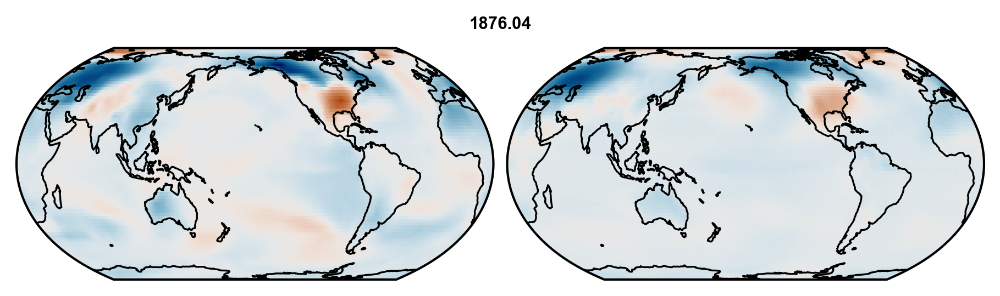

In [140]:
i = 103
fig, axs = subplots_cartopy(1, 2)
plot_field(axs, [
    da_tas.isel(time=i),
    da_tas_trunc.isel(time=i),
], colorbar=False)
fig.suptitle(f"{da_tas.time[i]:.2f}")

In [ ]:
da_tos = load_ersst()["tos"]
# da_tos = load_dcenti()["ts_merged"]
da_tos

<xarray.DataArray 'ts_merged' (time: 703, lat: 90, lon: 180)> Size: 46MB
[11388600 values with dtype=float32]
Coordinates:
  * time     (time) float64 6kB 1.85e+03 1.851e+03 ... 2.026e+03 2.026e+03
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
Attributes:
    units:         K
    cell_methods:  time: mean area: mean realization: mean
    bounds:        time_bnds
    axis:          T

In [142]:
da_tos_trunc = use_tuple_time_coords(mapper.truncate_dataset(da_tos.to_dataset(name="tos"))["tos"].compute())
da_tos_trunc

<xarray.DataArray 'tos' (time: 703, lat: 90, lon: 180)> Size: 91MB
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-0.69338839, -0.69338806, -0.69338863, ..., -0.69338854,
         -0.69338793, -0.69338836],
        [-0.69338908, -0.6933898 , -0.69339044, ..., -0.69338757,
         -0.69338835, -0.6933886 ],
        [-0.69337973, -0.69337957, -0.69337957, ..., -0.69338034,
         -0.6933801 , -0.69337986]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]]], shape=(703, 90, 180))
Coordinates:
  * time     (time) object 6kB MultiIndex
  * year     (time) int64 6kB 1850 1850 1850 1851 1851 ... 2025 2025 2025 2025
  * season   (time) object 6kB Season.MAM Season.JJA ... Season.JJA Season.SON
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0

In [143]:
ds_calib = xr.merge([da_tas_trunc, da_tos_trunc])
ds_calib

<xarray.Dataset> Size: 182MB
Dimensions:  (lat: 90, lon: 180, time: 703)
Coordinates:
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time     (time) object 6kB MultiIndex
  * year     (time) int64 6kB 1850 1850 1850 1851 1851 ... 2025 2025 2025 2025
  * season   (time) object 6kB Season.MAM Season.JJA ... Season.JJA Season.SON
Data variables:
    tas      (time, lat, lon) float64 91MB -1.404 -1.4 -1.396 ... 0.0 0.0 0.0
    tos      (time, lat, lon) float64 91MB nan nan nan nan ... 0.0 0.0 0.0 0.0

Text(0.5, 0.98, '1925.29')

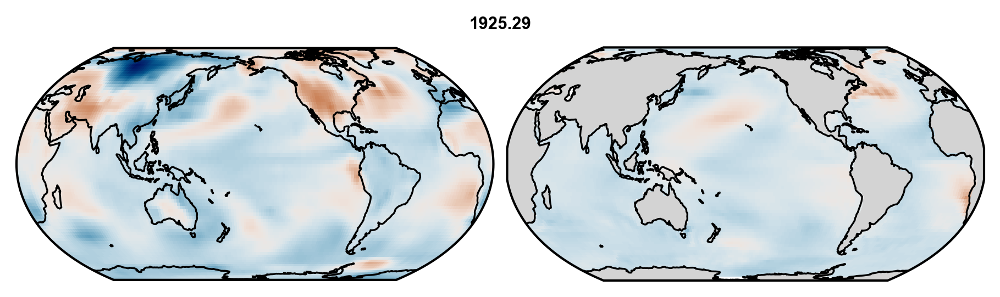

In [144]:
i = 300
fig, axs = subplots_cartopy(1, 2)
plot_field(axs, [
    da_tos.isel(time=i),
    da_tos_trunc.isel(time=i),
], shade_land=True, colorbar=False)
fig.suptitle(f"{da_tos.time[i]:.2f}")

# Seasonal

(<Figure size 3600x1200 with 2 Axes>,
 {'ts': <Axes: title={'center': 'noaa_Palmyra2020d18O (coral.d18O) @ (lat:5.87, lon:197.88)'}, xlabel='Time [yr]', ylabel='d18O [permil]'>,
  'map': <GeoAxes: >})

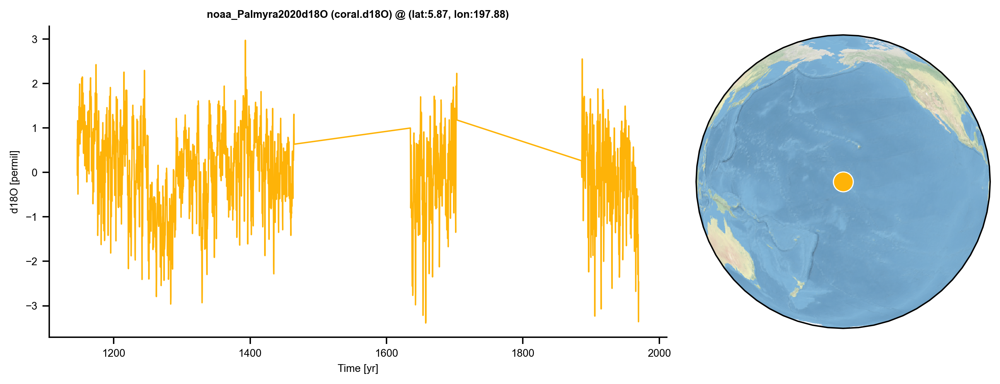

In [151]:
# proxy = list(pdb_seasonal.records.values())[103]
proxy = pdb_seasonal.records["noaa_Palmyra2020d18O"]
# proxy = pdb_seasonal.records["ch2k_MU18NPI01_SrCa"]#.slice((1, 2000))
da_proxy = use_tuple_time_coords(xr.DataArray(proxy.value, coords=dict(time=proxy.time)))
proxy.plot()

In [152]:
psms = {}

# da_calib = da_tas_trunc
da_calib = da_tos_trunc.sel(time=slice(None, 2000))
grid_lat, grid_lon = get_closest_gridpoint_with_data(proxy.lat, proxy.lon, da_calib)

for season in [Season.DJF, Season.MAM, Season.JJA, Season.SON]:
    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib.sel(lat=grid_lat, lon=grid_lon).sel(season=season).dropna("year"),
        da_proxy.sel(season=season).dropna("year"),
        join="inner"
    )
    if len(da_calib_for_proxy) < 25:
        raise ValueError(f"Insufficient calibration data (less than 25 samples) for {proxy.pid}")
    psm = LinearPSM(proxy.pid, "tas", grid_lat, grid_lon, season)
    psm.calibrate(da_calib_for_proxy.data, proxy_values_for_calib.data, da_calib_for_proxy.year.data, 4)
    psms[season] = psm

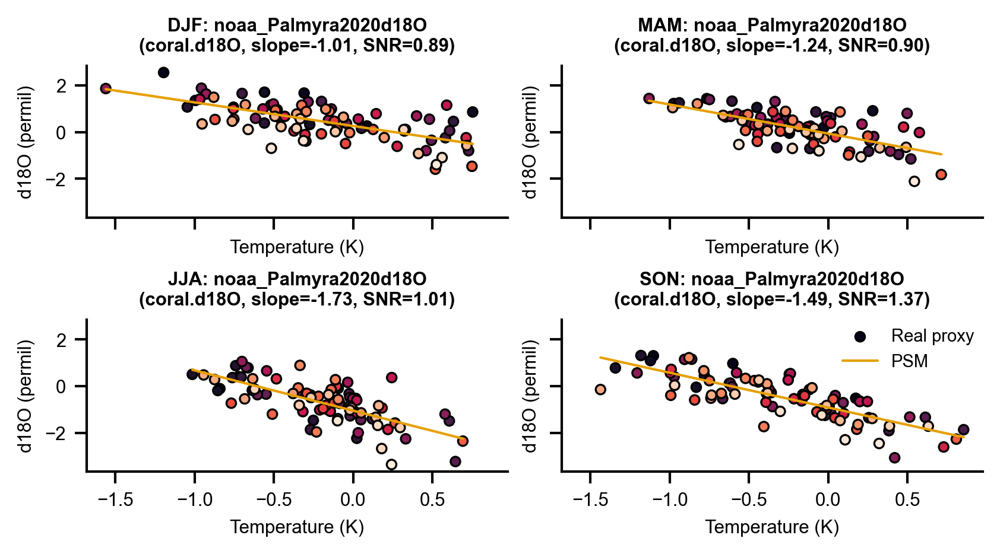

In [154]:
fig, axs = plt.subplots(2, 2, sharex="all", sharey="all", figsize=(5.5, 3))
for ax, season in zip(axs.flat, psms.keys()):
    psm = psms[season]

    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib.sel(lat=grid_lat, lon=grid_lon).sel(season=season).dropna("year"),
        da_proxy.sel(season=season).dropna("year"),
        join="inner"
    )

    scatter = ax.scatter(da_calib_for_proxy.data, proxy_values_for_calib.data,
               c=da_calib_for_proxy.year,
               edgecolor='black', s=15, label="Real proxy")
    xx = np.linspace(da_calib_for_proxy.data.min(), da_calib_for_proxy.data.max(), 4)
    ax.plot(xx, psm._model.intercept_[0] + xx * psm._model.coef_[0, 0], label="PSM")
    ax.set_xlabel("Temperature (K)")
    ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
    ax.set_title(f"{season.name}: {proxy.pid}\n({proxy.ptype}, slope={psm._model.coef_[0][0]:.2f}, SNR={psm.SNR:.2f})")
ax.legend()
# fig.colorbar(scatter, ax=axs, label="Time")
# ax.set_ylim(np.float64(-5.824979515166668), np.float64(-4.3210983295))
# ax.set_xlim(np.float64(-2.2288817182581555), np.float64(1.737829781592648))

Text(0.5, 1.0, 'ch2k_MU18NPI01_SrCa (coral.SrCa, BIC=-29.4, SNR=0.24)')

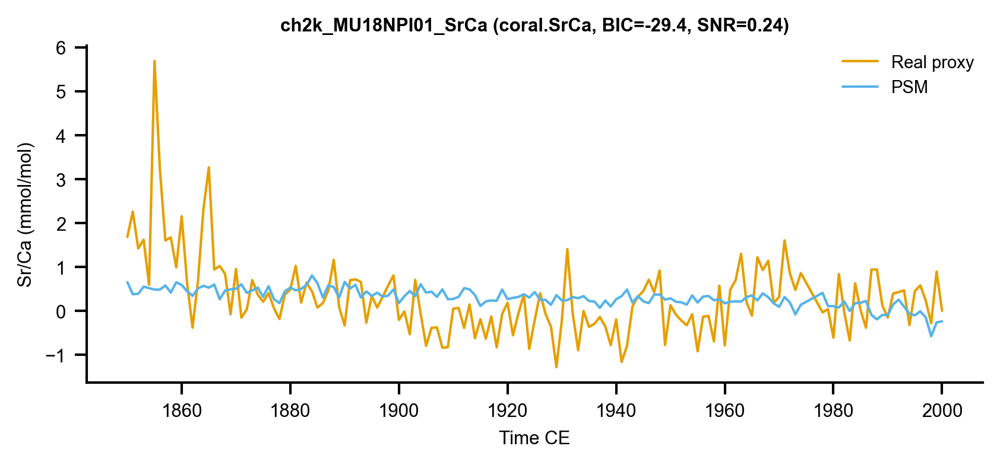

In [118]:
da_calib_for_proxy = use_decimal_year_time_coords(da_calib_for_proxy.rename(year="time"))
fig, ax = plt.subplots()
ax.plot(da_calib_for_proxy.time, proxy_values_for_calib, label="Real proxy")
ax.plot(da_calib_for_proxy.time, psm.forward(da_calib_for_proxy)[0, :], label="PSM")
ax.set_xlabel("Time CE")
ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
ax.legend()
ax.set_title(f"{proxy.pid} ({proxy.ptype}, BIC={psm.BIC:.1f}, SNR={psm.SNR:.2f})")

# Annual

(<Figure size 3600x1200 with 2 Axes>,
 {'ts': <Axes: title={'center': 'pages2k_Afr_012 (speleothem.d18O) @ (lat:-24.00, lon:29.18)'}, xlabel='Time [yr]', ylabel='d18O [permil]'>,
  'map': <GeoAxes: >})

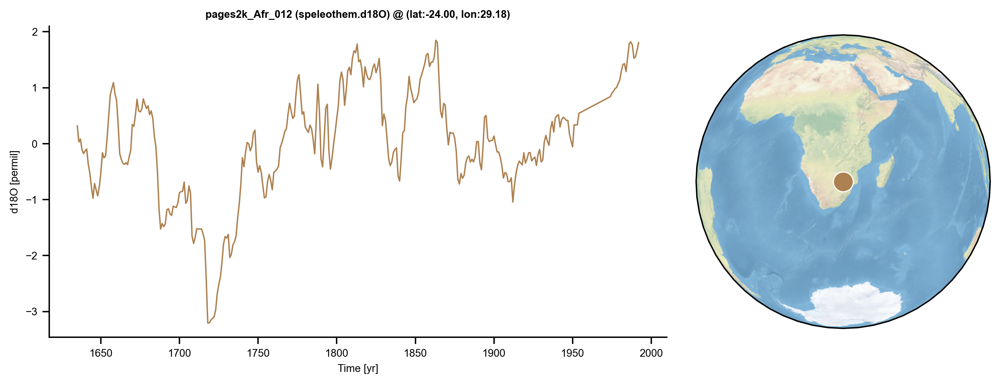

In [146]:
# proxy = list(pdb_annual.records.values())[80]
proxy = pdb_annual.records["pages2k_Afr_012"]
# proxy = pdb_annual.records["pages2k_Aus_031"]  # example of high error acor (0.87)
da_proxy = xr.DataArray(proxy.value, coords=dict(time=proxy.time))
proxy.plot()

In [147]:
from sklearn.linear_model import LinearRegression
from lmrecon.scripts.calibrate_psms import SEASONALITY_CANDIDATES


psm_candidates = []

for seasonality in SEASONALITY_CANDIDATES:
    field = "tas"
    # field = "tos"
    grid_lat, grid_lon = get_closest_gridpoint_with_data(proxy.lat, proxy.lon, ds_calib[field])
    da_calib_annual = annualize_seasonal_data(ds_calib[field], seasonality)
    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib_annual.sel(lat=grid_lat, lon=grid_lon).dropna("time"), da_proxy.dropna("time"), join="inner")
    if len(da_calib_for_proxy) < 25:
        raise ValueError("Insufficient calibration data (less than 25 for {proxy.pid}")
    reg = LinearRegression()
    psm = LinearPSM(proxy.pid, field, grid_lat, grid_lon, seasonality, reg)
    psm.calibrate(da_calib_for_proxy.data, proxy_values_for_calib.data, da_calib_for_proxy.time.data, 1)
    print(seasonality, np.abs(psm.corr), psm.BIC, psm.annual_error_acor)
    if np.abs(psm.corr) < 0.05:
        continue
    psm_candidates.append(psm)

psm_opt = psm_candidates[np.argmin([psm.BIC for psm in psm_candidates])]
print("Optimal seasonality:", psm_opt.seasonality)

[<Season.DJF: 0>, <Season.MAM: 1>, <Season.JJA: 2>, <Season.SON: 3>] 0.24211493451515953 -67.34461983107572 0.9355629231523075
[<Season.SON: 3>, <Season.DJF: 0>, <Season.MAM: 1>, <Season.JJA: 2>] 0.23841836515282785 -67.11274537631786 0.9330937748381269
[<Season.JJA: 2>, <Season.SON: 3>, <Season.DJF: 0>, <Season.MAM: 1>] 0.24078639103840796 -67.26082326871096 0.9346114204441721
[<Season.MAM: 1>, <Season.JJA: 2>, <Season.SON: 3>, <Season.DJF: 0>] 0.24354912485773972 -67.4356621805054 0.9379810864014396
[<Season.JJA: 2>] 0.2698528800401999 -70.5153537874782 0.9186383026082483
[<Season.MAM: 1>, <Season.JJA: 2>] 0.2666424691358135 -70.28521945526658 0.9245576936384482
[<Season.JJA: 2>, <Season.SON: 3>] 0.26073178052427975 -69.86980537419777 0.9268849154351909
[<Season.DJF: 0>] 0.14452349528775046 -62.510750135966376 0.9456064323553819
[<Season.SON: 3>, <Season.DJF: 0>] 0.18995584871146426 -64.43472348605145 0.9394301430197819
[<Season.DJF: 0>, <Season.MAM: 1>] 0.20010521658331962 -64.94093

Text(0.5, 1.0, 'pages2k_Afr_012 (speleothem.d18O, BIC=-70.5, SNR=0.28)')

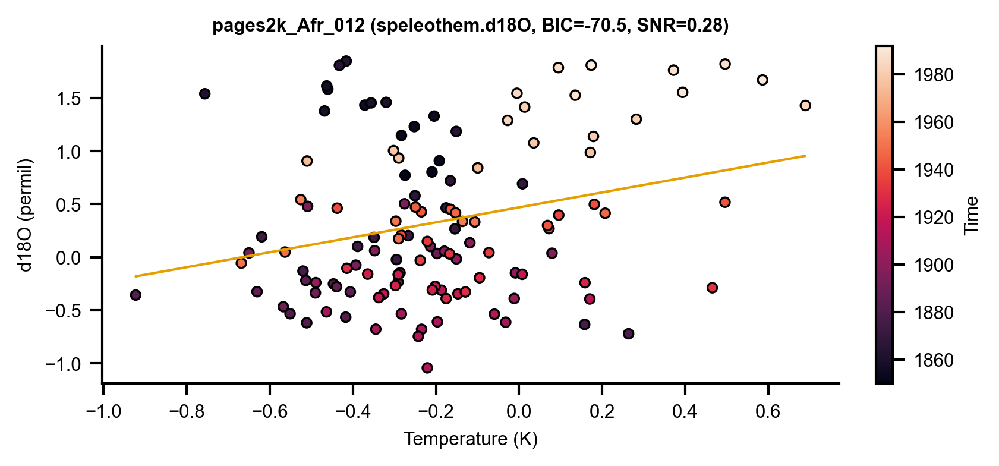

In [148]:
da_calib_annual = annualize_seasonal_data(ds_calib[field], psm_opt.seasonality)
da_calib_for_proxy, proxy_values_for_calib = xr.align(
    da_calib_annual.sel(lat=grid_lat, lon=grid_lon).dropna("time"), da_proxy.dropna("time"), join="inner")

fig, ax = plt.subplots()
scatter = ax.scatter(da_calib_for_proxy.data, proxy_values_for_calib.data,
                     c=da_calib_for_proxy.time, s=15, edgecolor='black', label="Real proxy")
fig.colorbar(scatter, ax=ax, label="Time")
xx = np.linspace(da_calib_for_proxy.data.min(), da_calib_for_proxy.data.max(), 4)
ax.plot(xx, psm_opt._model.intercept_[0] + xx * psm_opt._model.coef_[0, 0], label="PSM")
ax.set_xlabel("Temperature (K)")
ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
ax.set_title(f"{proxy.pid} ({proxy.ptype}, BIC={psm_opt.BIC:.1f}, SNR={psm_opt.SNR:.2f})")

Text(0.5, 1.0, 'pages2k_Afr_012 (speleothem.d18O)')

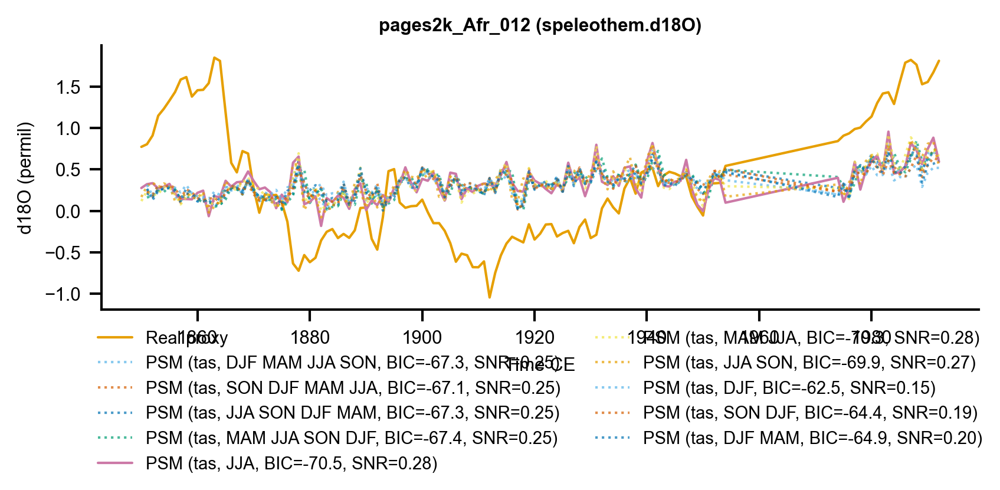

In [149]:
fig, ax = plt.subplots()
ax.plot(da_calib_for_proxy.time, proxy_values_for_calib, label="Real proxy")
for psm in psm_candidates:
    da_calib_annual = annualize_seasonal_data(ds_calib[psm.field], psm.seasonality)
    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib_annual.sel(lat=grid_lat, lon=grid_lon).dropna("time"),
        da_proxy.dropna("time"),
        join="inner",
    )

    szn = " ".join(Season.to_str_list(psm.seasonality))
    ax.plot(
        da_calib_for_proxy.time,
        psm.forward(da_calib_for_proxy)[0, :],
        label=f"PSM ({psm.field}, {szn}, BIC={psm.BIC:.1f}, SNR={psm.SNR:.2f})",
        alpha=1 if psm == psm_opt else 0.7,
        ls="-" if psm == psm_opt else ":"
    )
ax.set_xlabel("Time CE")
ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
ax.legend(bbox_to_anchor=(0.5, -0.65), loc="lower center", ncols=2)
ax.set_title(f"{proxy.pid} ({proxy.ptype})")